## Exploring larval _Drosophila_ anemotaxis behavioural data
Written by Sharbat based on Timothee, with help from GitHub Copilot, 2025

In [1]:
import pandas as pd
from matplotlib import cm 
import matplotlib.pyplot as plt 
from scipy import stats
import numpy as np
import src.parse_data as anm_parse
import src.plot_data as anm_plot
plt.style.use('../anemotaxis.mplstyle')

In [7]:
%matplotlib widget
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
data_folder = "/Users/sharbat/Documents/anemotaxis/data/20240219_140808/"
columns = ["time","id","persistence","speed","midline","loc_x","loc_y","vel_x","vel_y","orient","pathlen"]
larvae_data = anm_parse.extract_all_larvae(data_folder, columns)

In [10]:
from pprint import pprint
larva_id = '30.00003'
# Accessing metadata, data, and summary for larva "30.00001"
pprint(larvae_data[larva_id]["metadata"])  # Experiment details
# pprint(larvae_data["30.00001"]["data"])     # Extracted raw data (commented out)
pprint(larvae_data[larva_id]["summary"])   # Summary statistics

{'date': '20240219_140808',
 'effector': 'UAS_TNT_2_0003',
 'genotype': 'GMR_SS01948',
 'interval_between_repetitions': '0s',
 'number_of_repetitions': 1,
 'prestimulus_duration': '2s',
 'raw_protocol': 'p_5gradient2_2s1x600s0s#n#n#n',
 'stimulus_duration': '600s',
 'stimulus_specifications': '5gradient2',
 'stimulus_type': 'p',
 'tracker': 't7'}
{'id': {'max': np.int64(3),
        'mean': np.float64(3.0),
        'min': np.int64(3),
        'size': 7018},
 'loc_x': {'max': np.float64(100.933),
           'mean': np.float64(84.45570376175549),
           'min': np.float64(70.64),
           'size': 7018},
 'loc_y': {'max': np.float64(59.064),
           'mean': np.float64(49.02224052436592),
           'min': np.float64(40.772),
           'size': 7018},
 'midline': {'max': np.float64(3.649),
             'mean': np.float64(2.886125819321744),
             'min': np.float64(1.375),
             'size': 7018},
 'orient': {'max': np.float64(179.9),
            'mean': np.float64(0.196152

### Single larva parameter plots

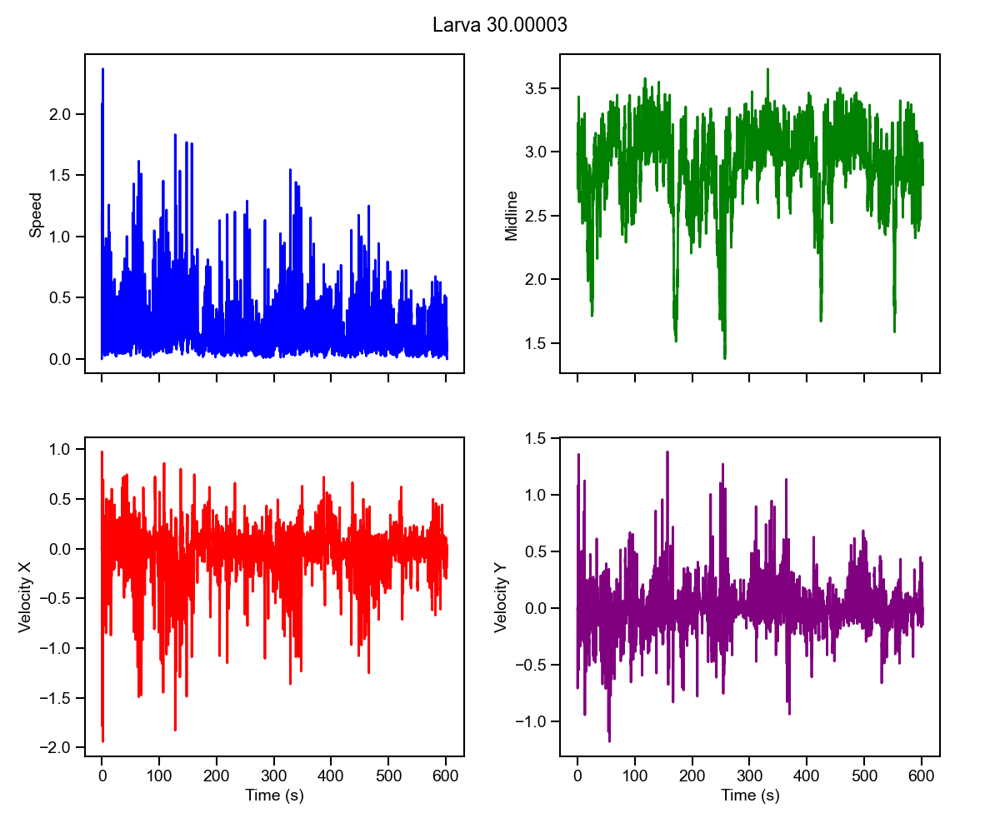

In [11]:
anm_plot.plot_larva_data(larvae_data[larva_id]['data'], larva_id)

In [12]:
larva_id = '30.00001'

FloatSlider(value=0.007, description='Time', layout=Layout(width='800px'), max=602.17, min=0.007, step=0.08580…

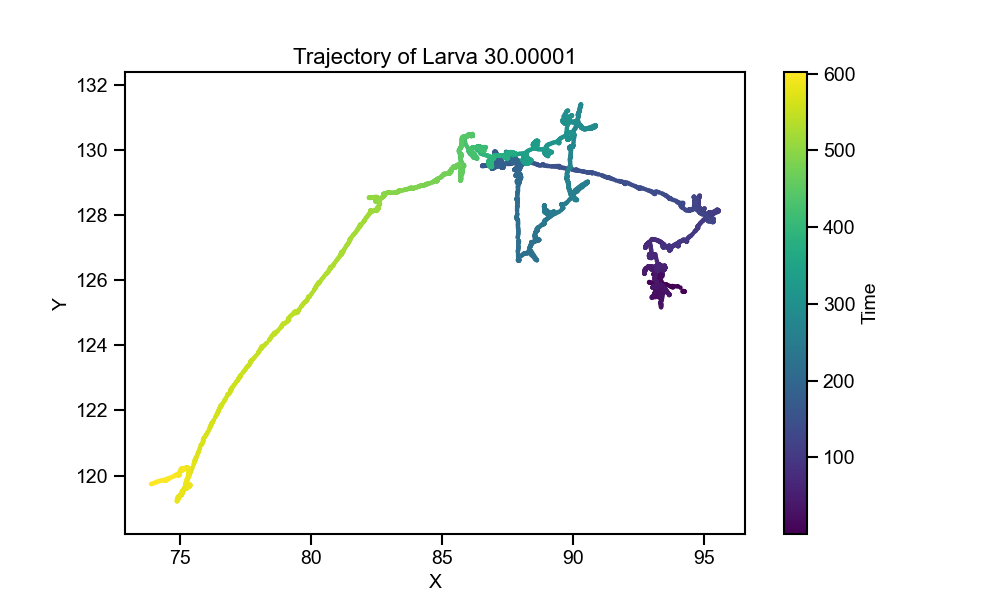

In [13]:
anm_plot.plot_trajectory_2d_interactive(larvae_data[larva_id]["data"], larva_id)

### K-means clustering on dimension-reduced behaviour data

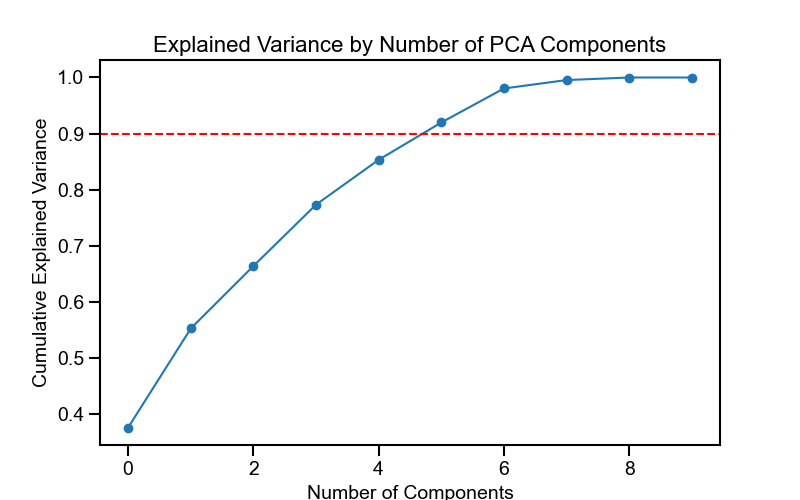

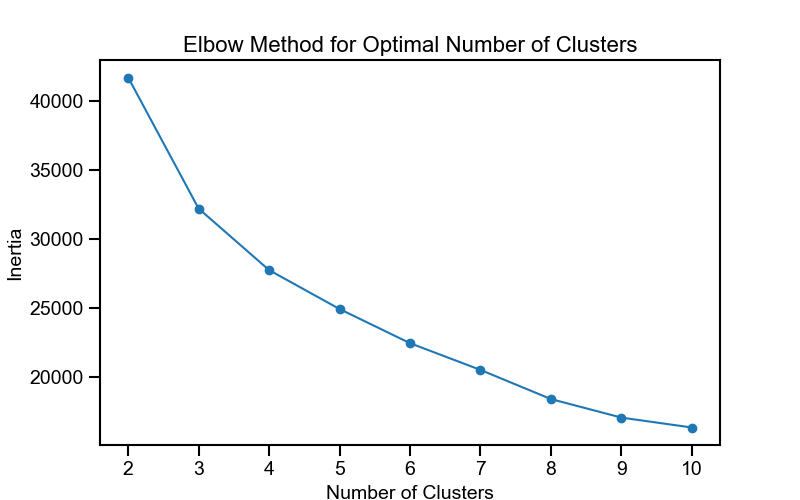

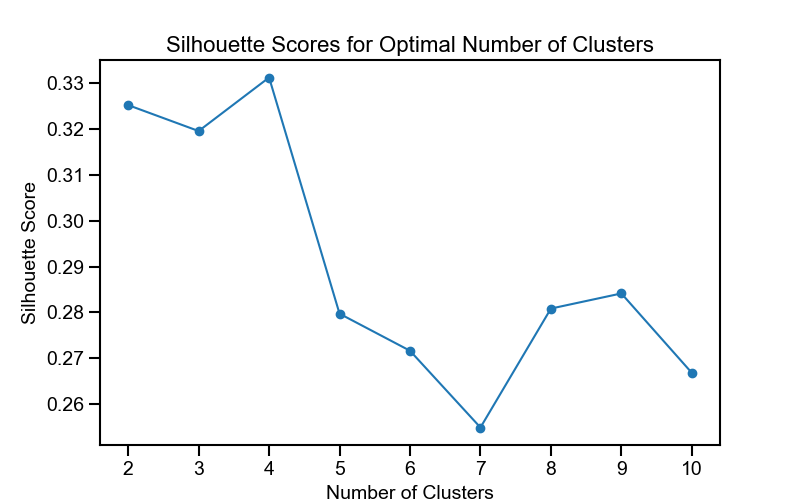

Optimal number of PCA components: 6
Optimal number of clusters: 4


In [14]:
clustered_data, optimal_components, optimal_clusters = anm_parse.cluster_behaviors(larvae_data[larva_id]["data"], variance_threshold=0.90, max_clusters=10)
print(f'Optimal number of PCA components: {optimal_components}')
print(f'Optimal number of clusters: {optimal_clusters}')

In [15]:
clustered_data

,time,persistence,speed,midline,loc_x,loc_y,vel_x,vel_y,orient,pathlen,cluster,pca_1,pca_2,pca_3,pca_4,pca_5,pca_6
0,0.007,602.2,0.000,3.130,94.210,125.643,0.000,0.000,173.6,0.000,2,2.662935,0.445205,-0.180521,-0.829590,0.741830,1.661111
1,0.062,602.2,0.000,3.088,94.219,125.655,0.000,0.000,173.2,0.000,2,2.686698,0.390985,-0.220193,-0.817779,0.687024,1.674863
2,0.116,602.2,0.247,2.972,94.186,125.654,0.247,0.015,173.3,0.000,2,2.920024,0.569611,0.073767,-1.668280,1.404118,1.089870
3,0.171,602.2,0.384,3.032,94.252,125.649,0.382,-0.034,173.8,0.000,2,2.921890,0.872629,0.055262,-2.052598,2.157394,0.746921
4,0.226,602.2,0.231,2.972,94.262,125.647,0.229,0.028,174.1,0.000,2,2.933485,0.547240,0.118974,-1.632565,1.294696,1.129496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7013,601.811,602.2,0.504,3.273,74.054,119.782,-0.478,-0.158,-168.8,25.948,1,-5.066866,2.967738,-0.773049,-0.746400,-1.312138,0.690266
7014,601.901,602.2,0.558,3.392,74.004,119.768,-0.539,-0.143,-169.2,25.948,1,-5.150930,3.507885,-0.633360,-0.709129,-1.427280,0.559032
7015,601.989,602.2,0.000,3.317,73.959,119.757,0.000,0.000,-169.4,25.948,1,-4.706401,-0.574287,0.435362,-1.760770,-0.126019,1.274720
7016,602.076,602.2,0.000,3.289,73.895,119.742,0.000,0.000,-169.5,25.948,1,-4.699459,-0.609546,0.408290,-1.758904,-0.164449,1.290958


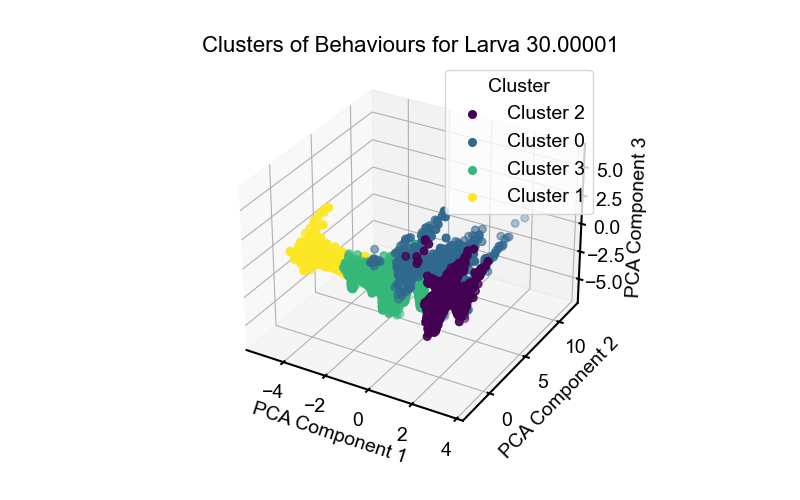

In [16]:
anm_plot.plot_clusters(clustered_data, larva_id, n_components=3)

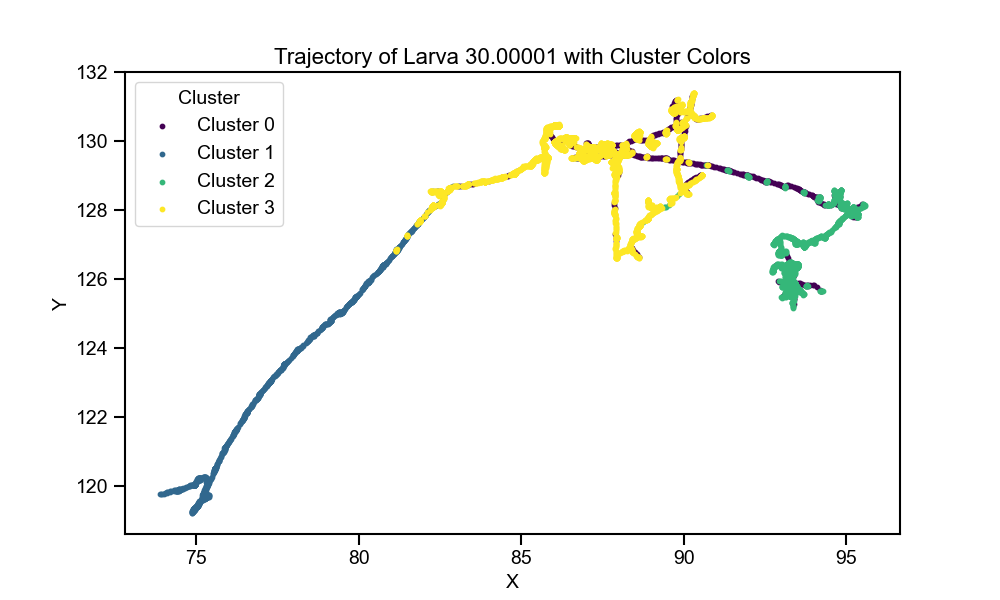

In [17]:
anm_plot.plot_trajectory_with_clusters(larvae_data[larva_id]["data"], clustered_data, larva_id)

### Mean $N_{ind}$ calculation
Check the code in `parse_data.py` for calculation of $N_{ind}$ along both X-axis and Y-axis

In [18]:
ni_dict_x = anm_parse.compute_navigational_index(larvae_data, ax="x")
ni_dict_y = anm_parse.compute_navigational_index(larvae_data, ax="y")
for larva_id, ni in ni_dict_x.items():
    print(f"Larva {larva_id} - Navigational Index: {ni['NI_mean']}, Normalized Navigational Index: {ni['NI_norm']}")

Larva 30.00382 - Navigational Index: 0      -0.33099
1      -0.33099
2      -0.33099
3      -0.33099
4      -0.33099
         ...   
1982   -0.33099
1983   -0.33099
1984   -0.33099
1985   -0.33099
1986   -0.33099
Name: NI_mean, Length: 1987, dtype: float64, Normalized Navigational Index: 0      -0.33099
1      -0.33099
2      -0.33099
3      -0.33099
4      -0.33099
         ...   
1982   -0.33099
1983   -0.33099
1984   -0.33099
1985   -0.33099
1986   -0.33099
Name: NI_norm, Length: 1987, dtype: float64
Larva 30.00022 - Navigational Index: 0      -0.308277
1      -0.308277
2      -0.308277
3      -0.308277
4      -0.308277
          ...   
7013   -0.308277
7014   -0.308277
7015   -0.308277
7016   -0.308277
7017   -0.308277
Name: NI_mean, Length: 7018, dtype: float64, Normalized Navigational Index: 0      -0.308277
1      -0.308277
2      -0.308277
3      -0.308277
4      -0.308277
          ...   
7013   -0.308277
7014   -0.308277
7015   -0.308277
7016   -0.308277
7017   -0.308277
Name

### Histogram mean X-axis $N_{ind}$ across larvae

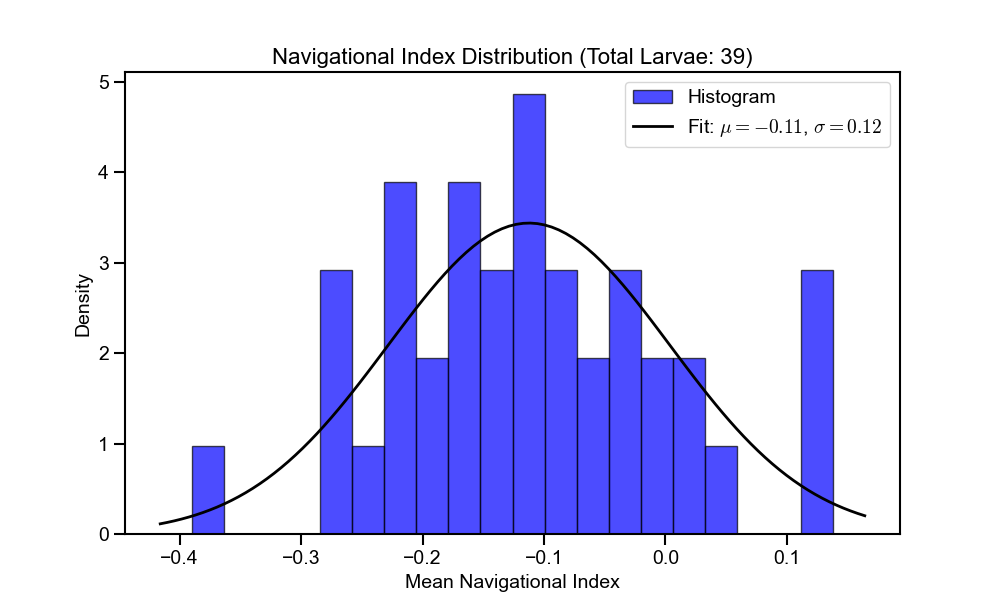

Mean Navigational Index: -0.11
Standard Deviation of Navigational Index: 0.12


In [19]:
anm_plot.plot_navigational_index_histogram(ni_dict_x, bins=20, density=True, fit_distribution=True)

### Histogram mean Y-axis $N_{ind}$ across larvae

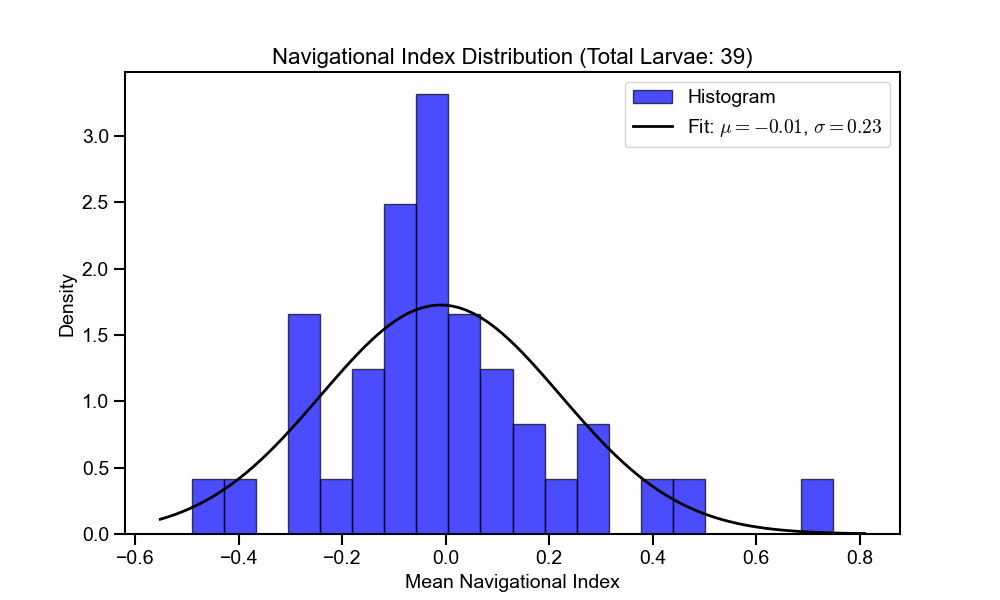

Mean Navigational Index: -0.01
Standard Deviation of Navigational Index: 0.23


In [20]:
anm_plot.plot_navigational_index_histogram(ni_dict_y, bins=20, density=True, fit_distribution=True)

### Individual X-axis $N_{ind}$ time-series 

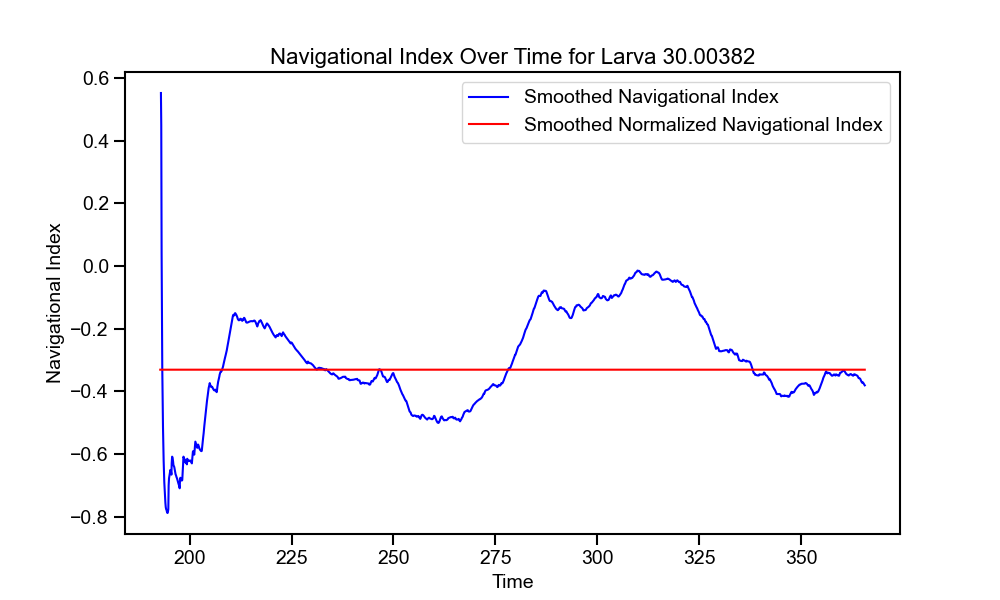

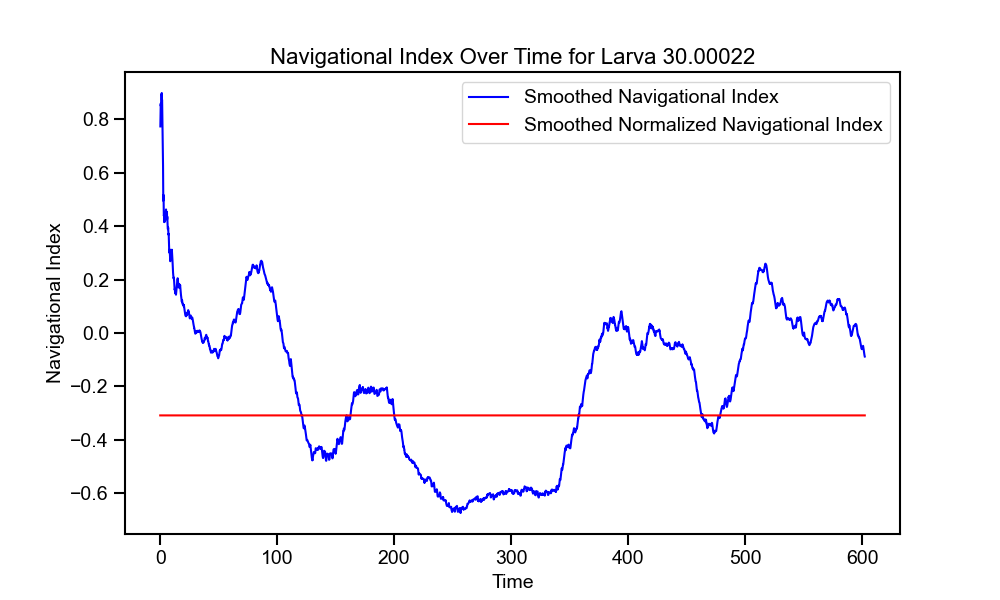

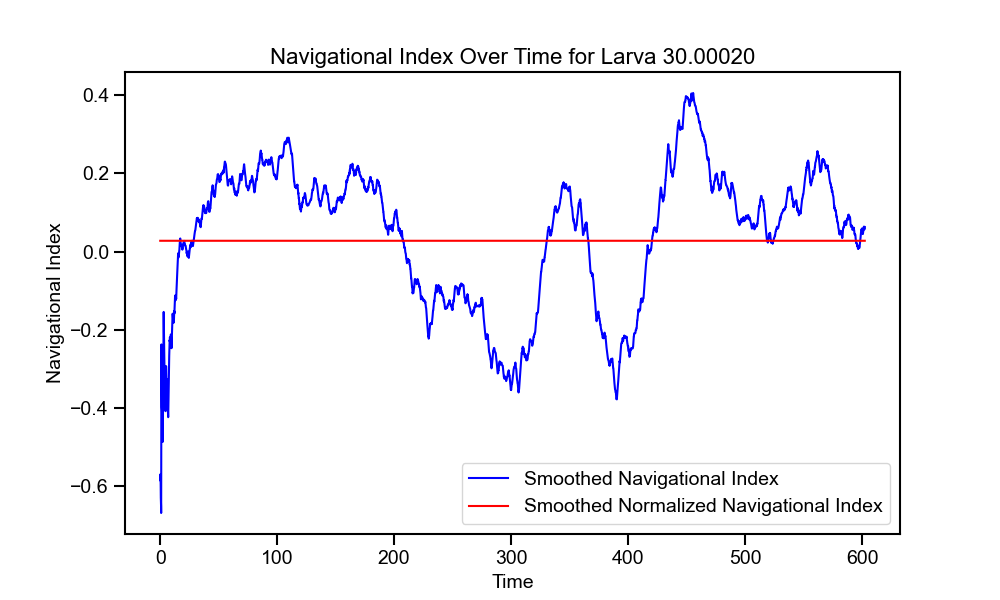

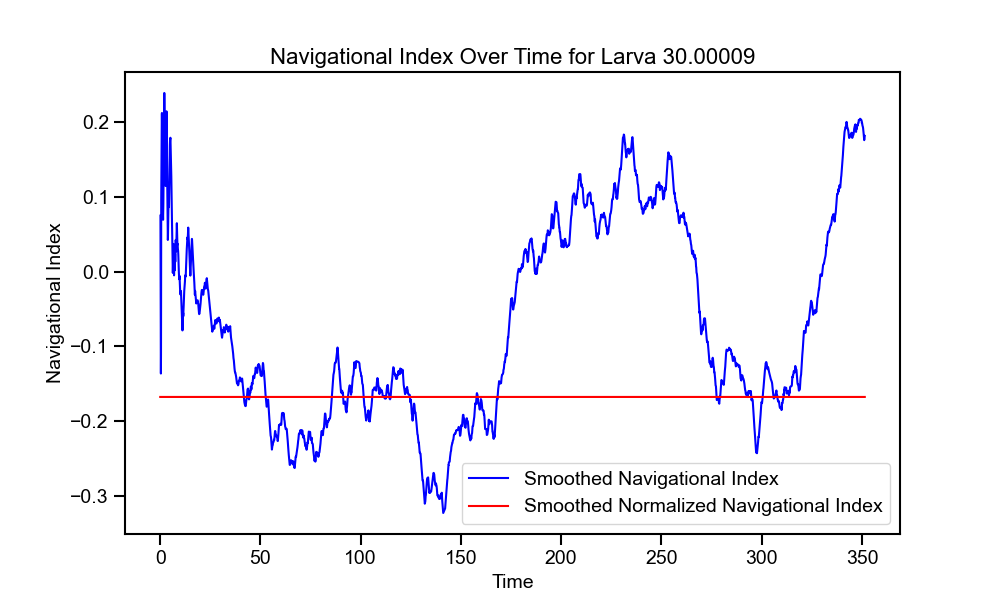

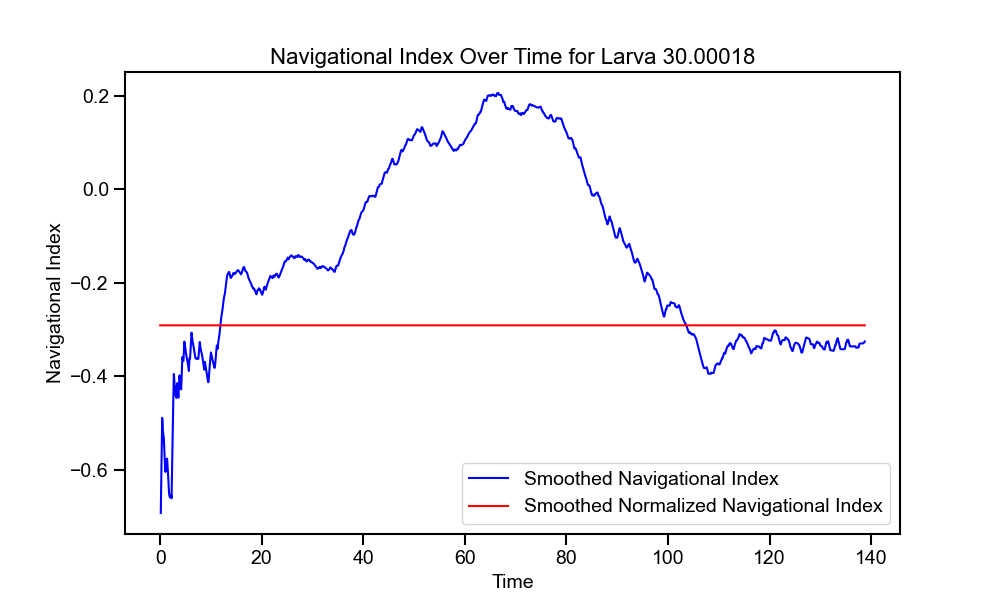

...

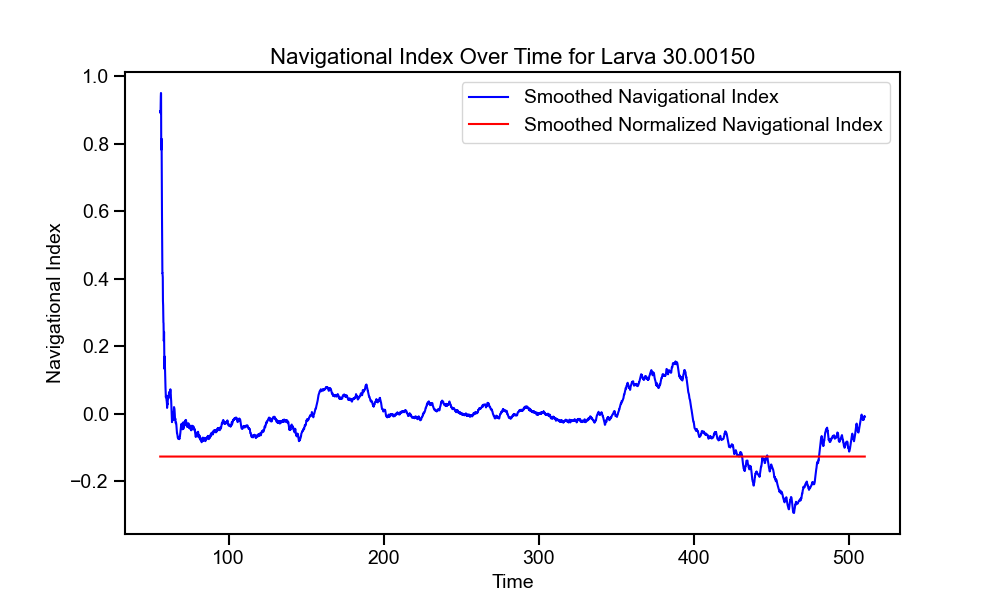

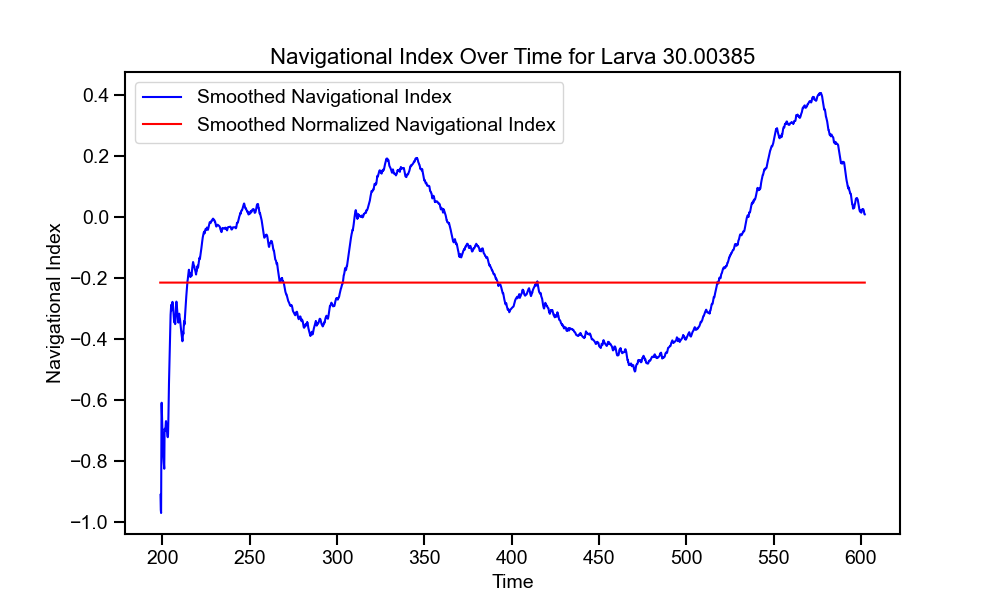

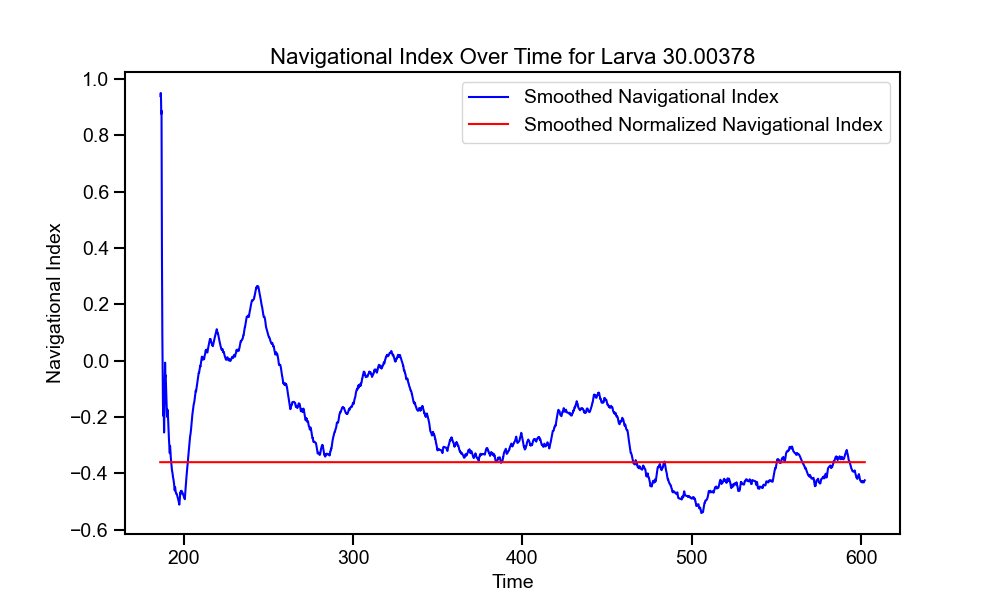

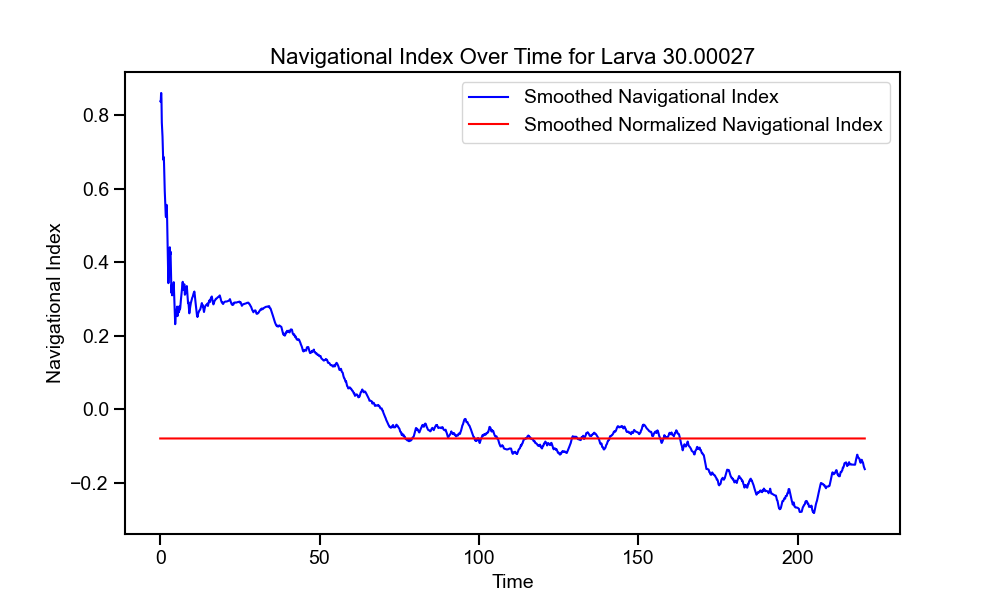

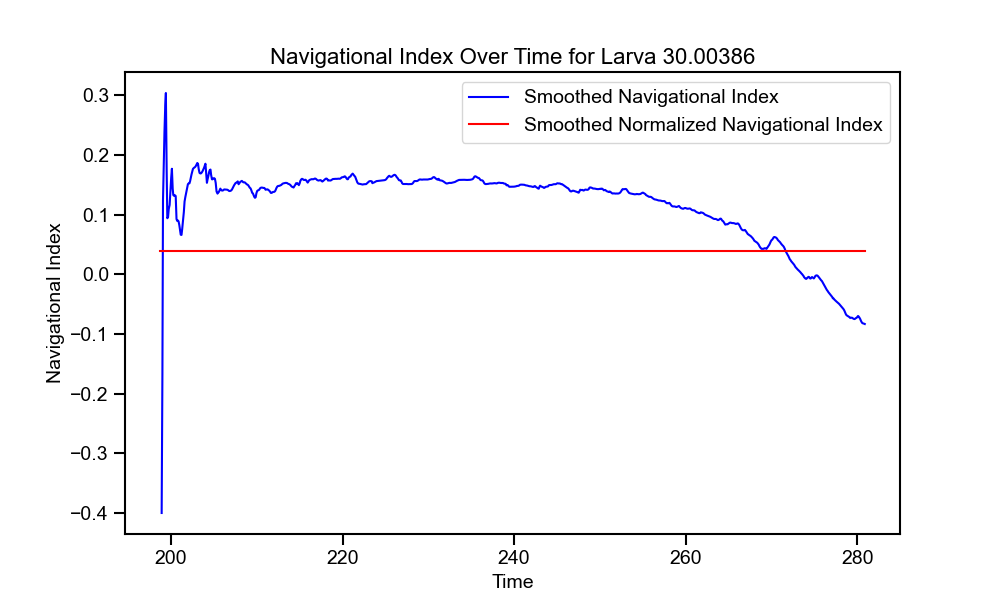

/Users/sharbat/Documents/anemotaxis/src/plot_data.py:221: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


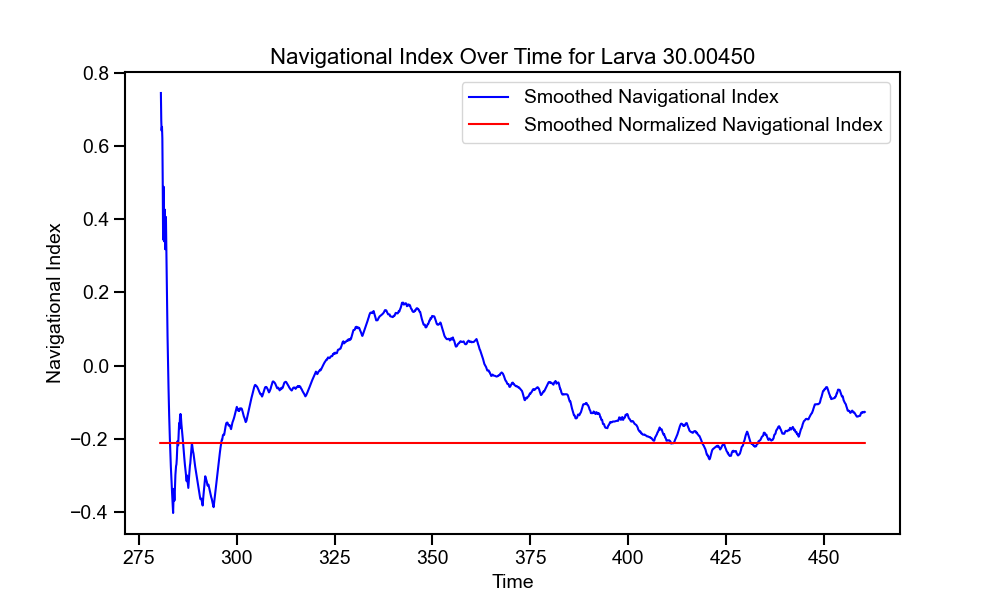

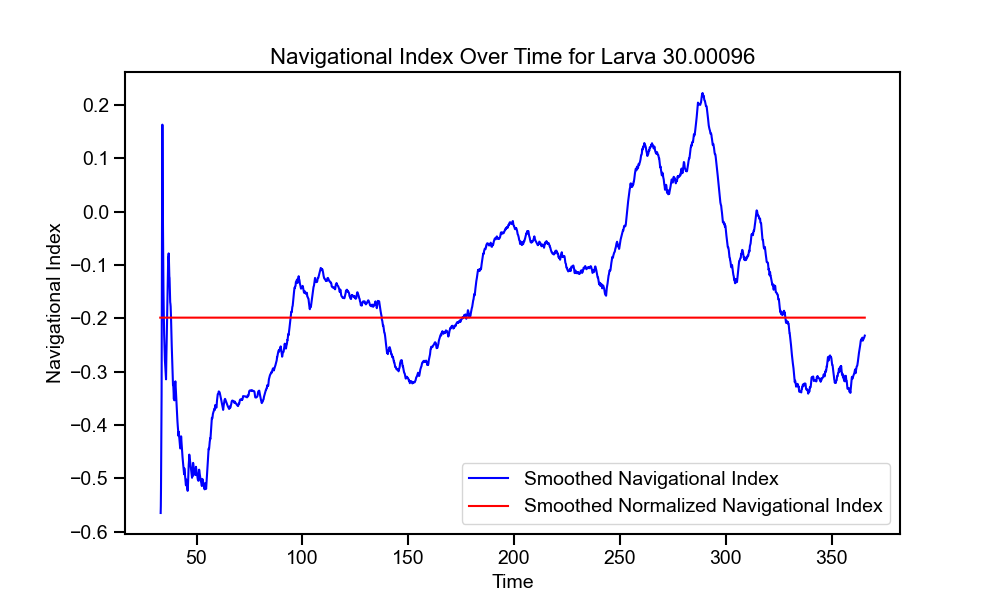

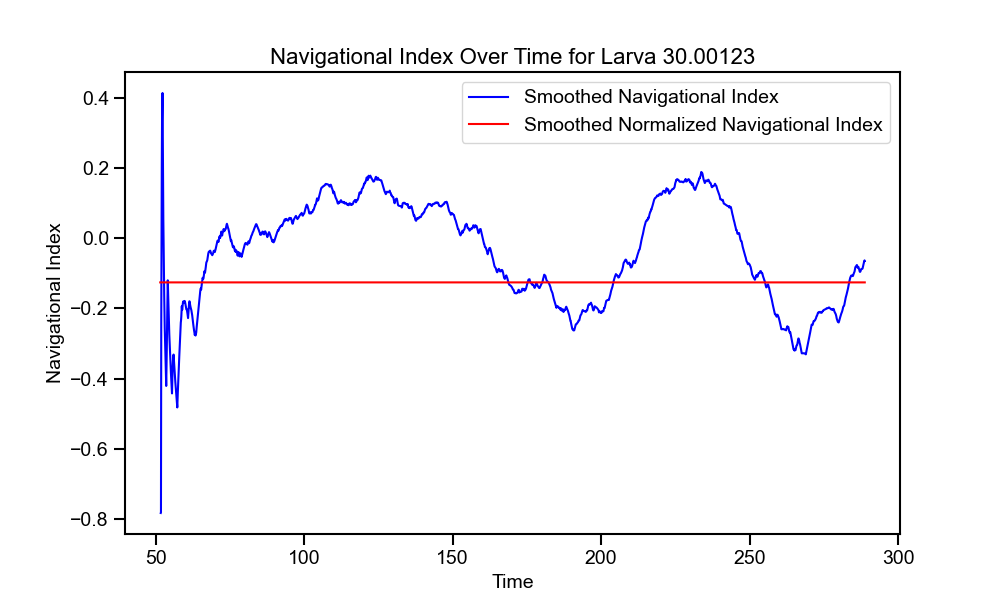

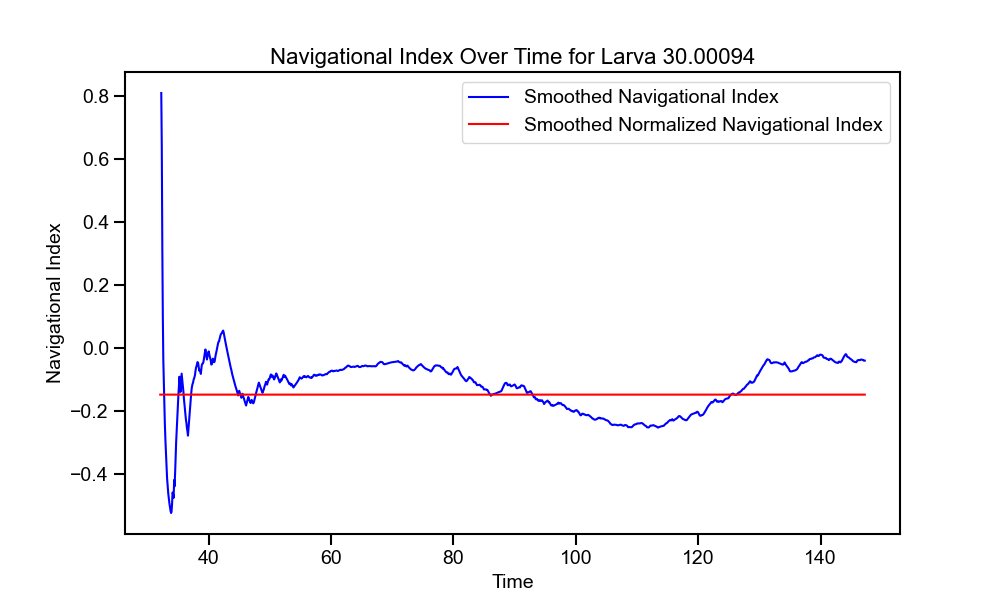

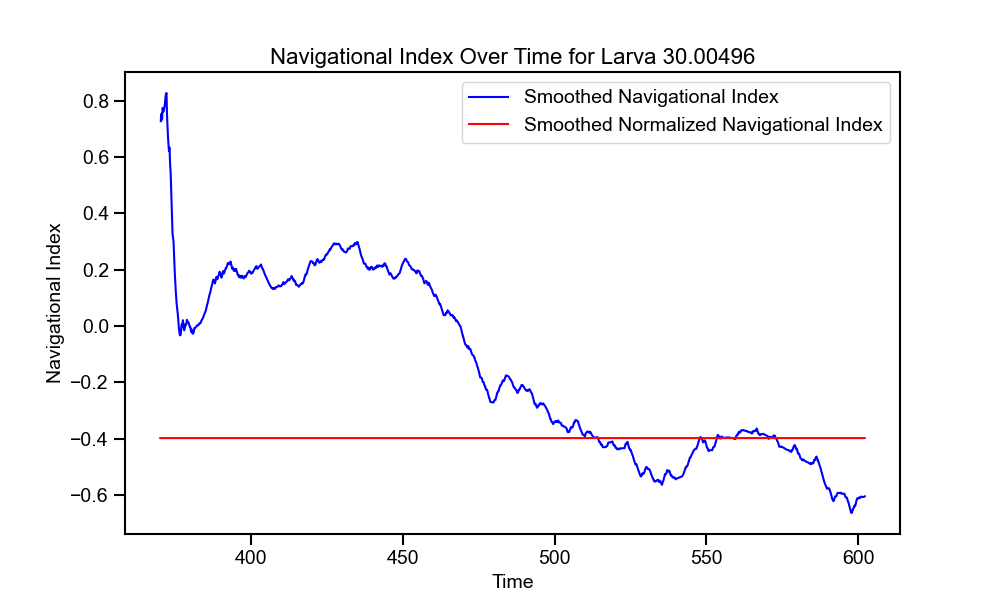

...

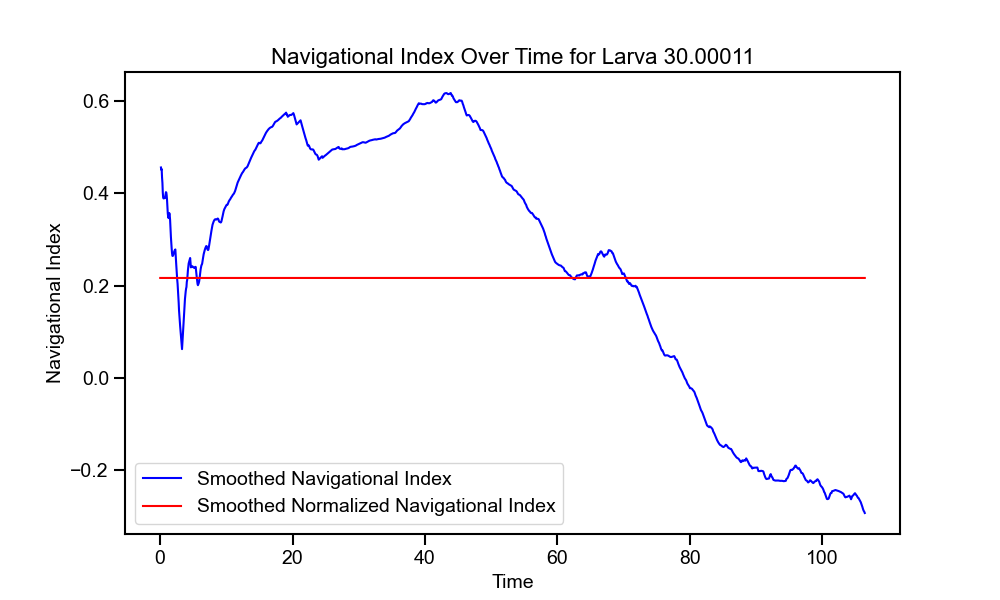

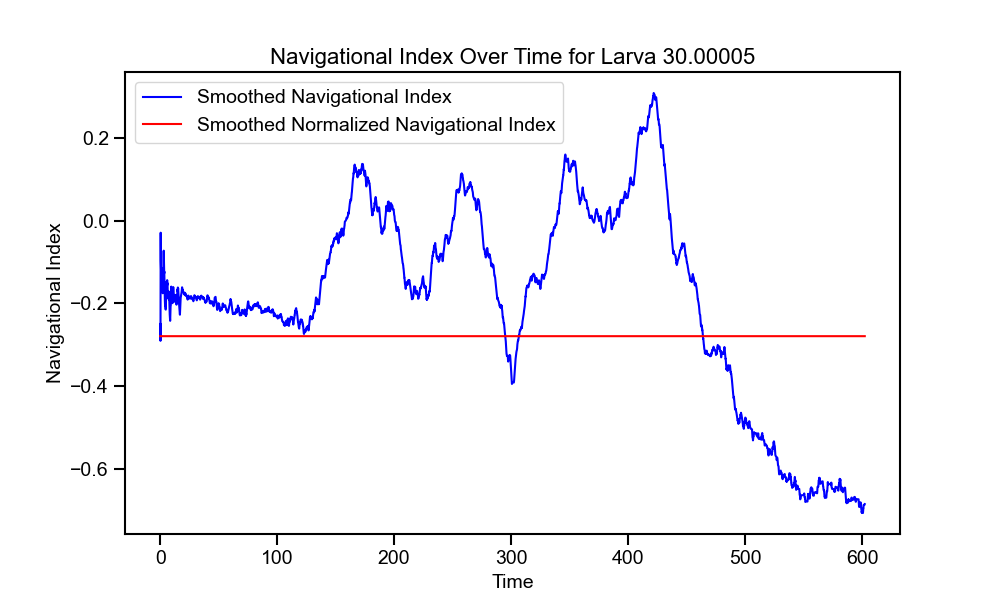

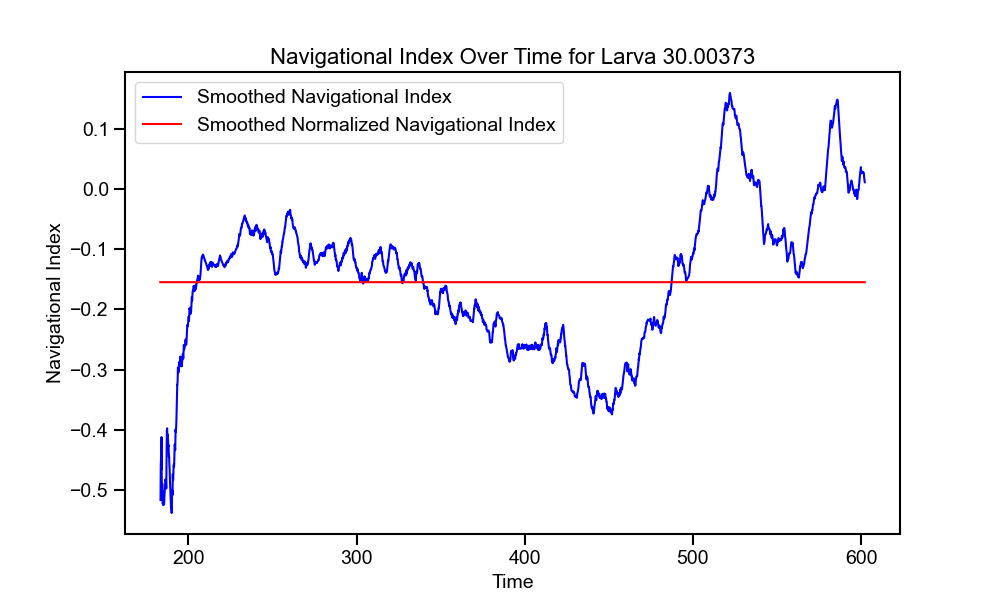

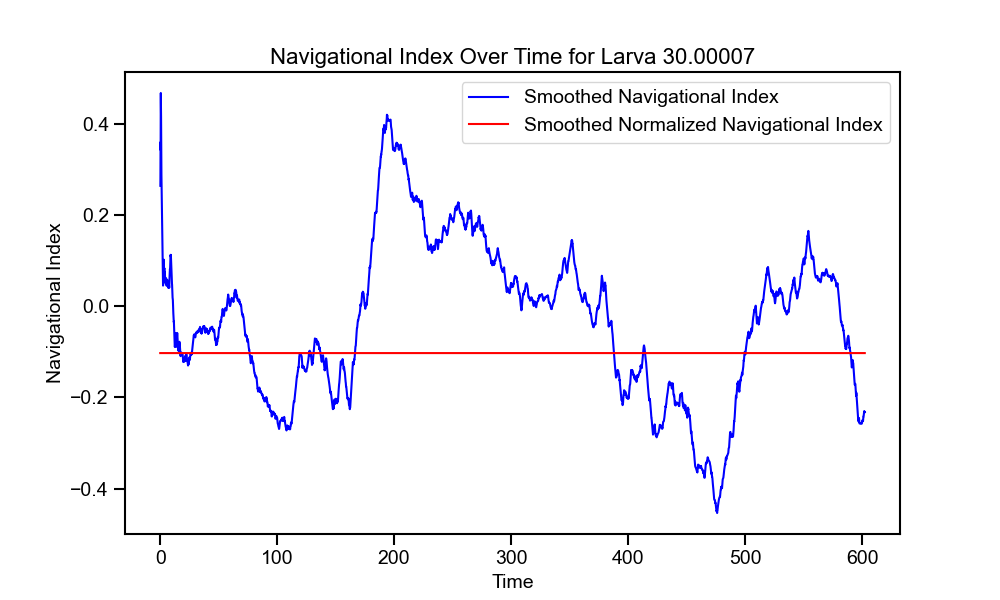

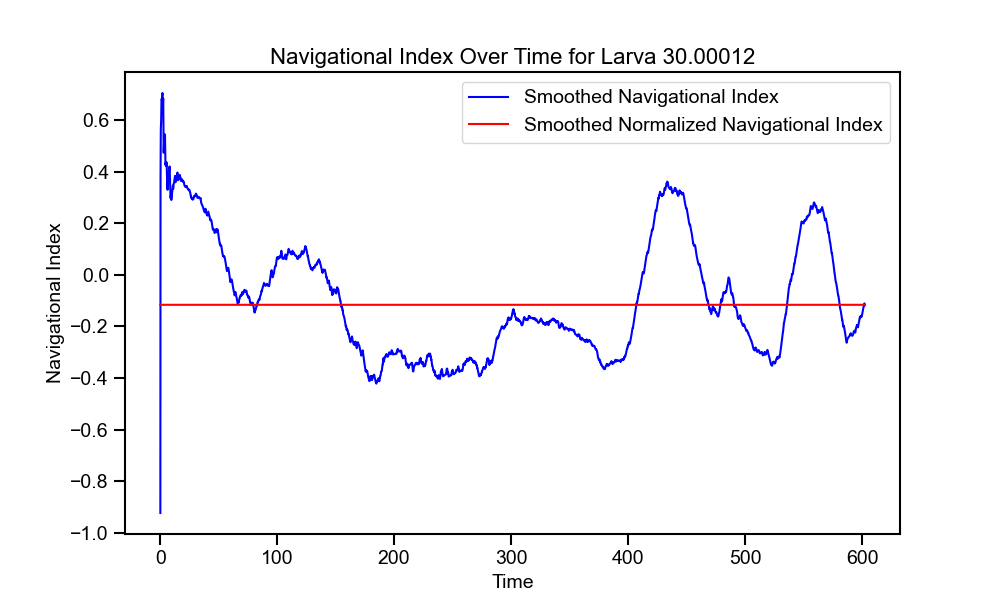

In [21]:
# Plot for all larva IDs in ni_dict with a specified window size
window_size = 500 
for larva_id, ni_df in ni_dict_x.items():
    anm_plot.plot_navigational_index_time_series_single(ni_df, larva_id, window_size)

### Individual Y-axis $N_{ind}$ time-series

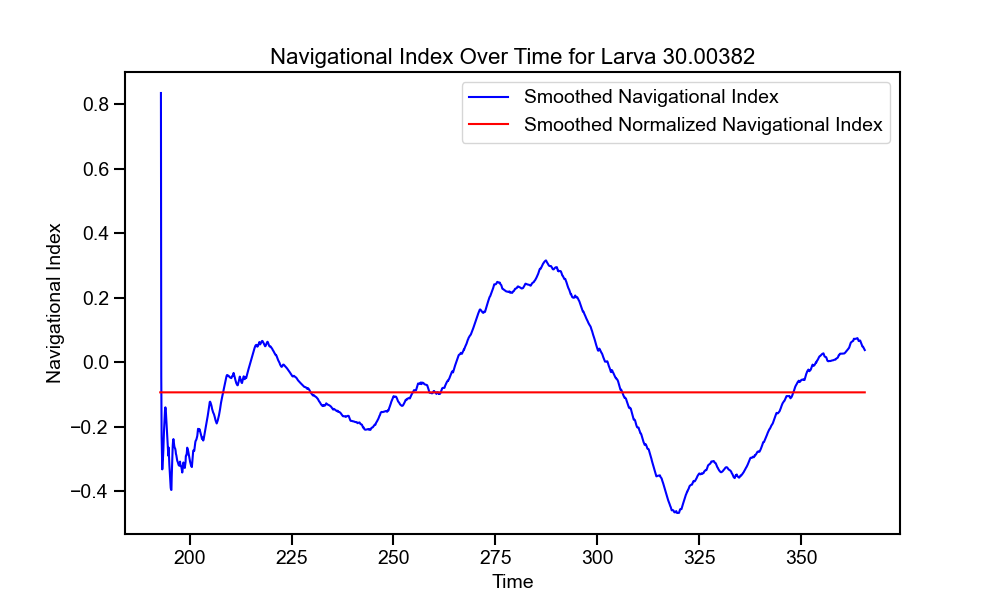

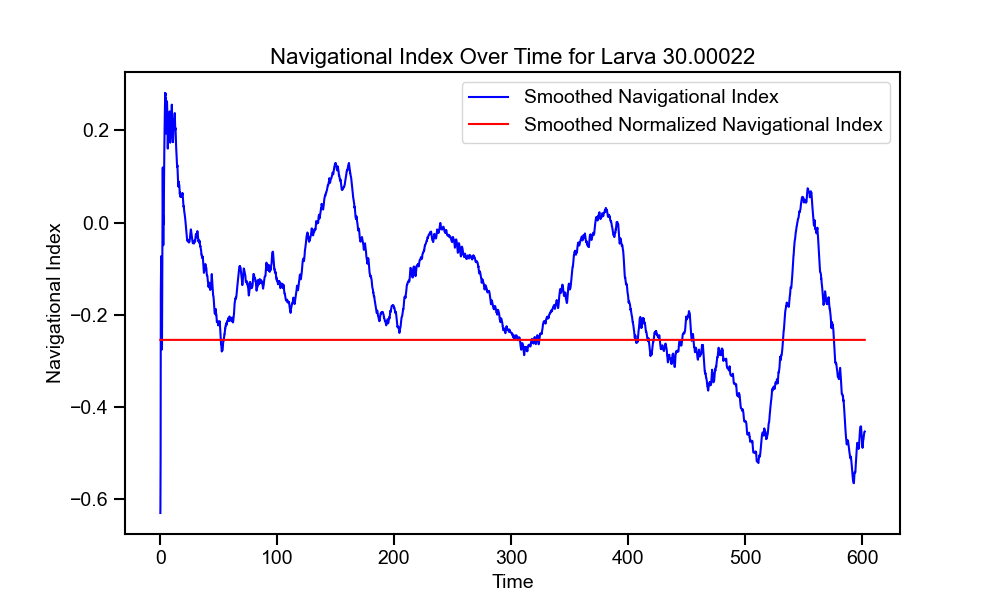

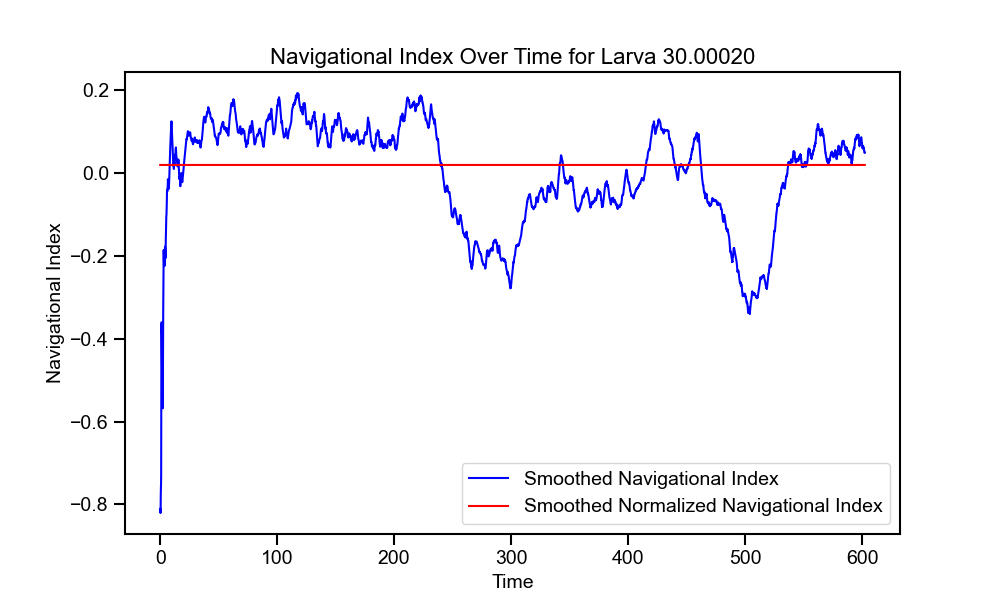

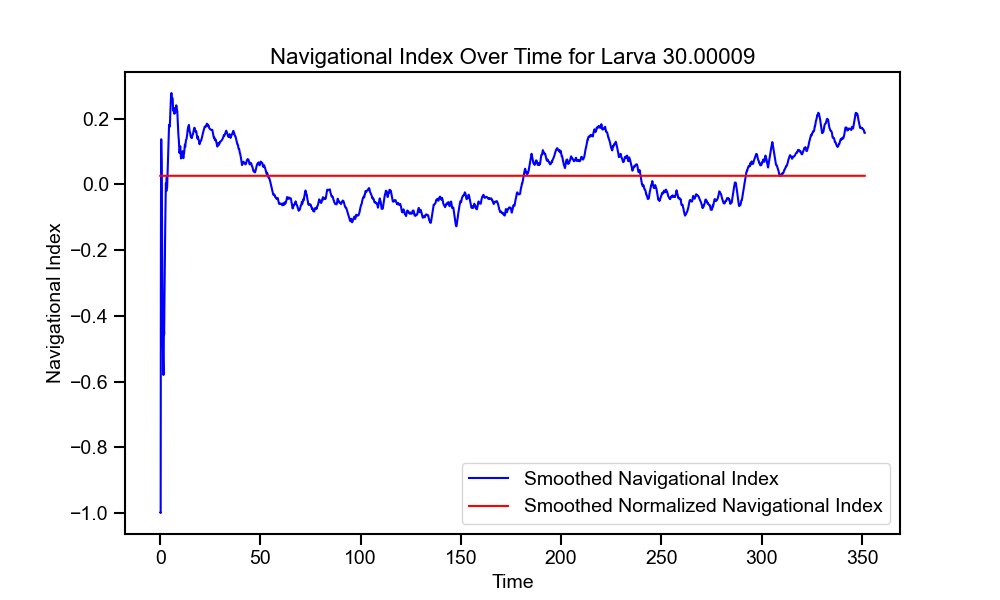

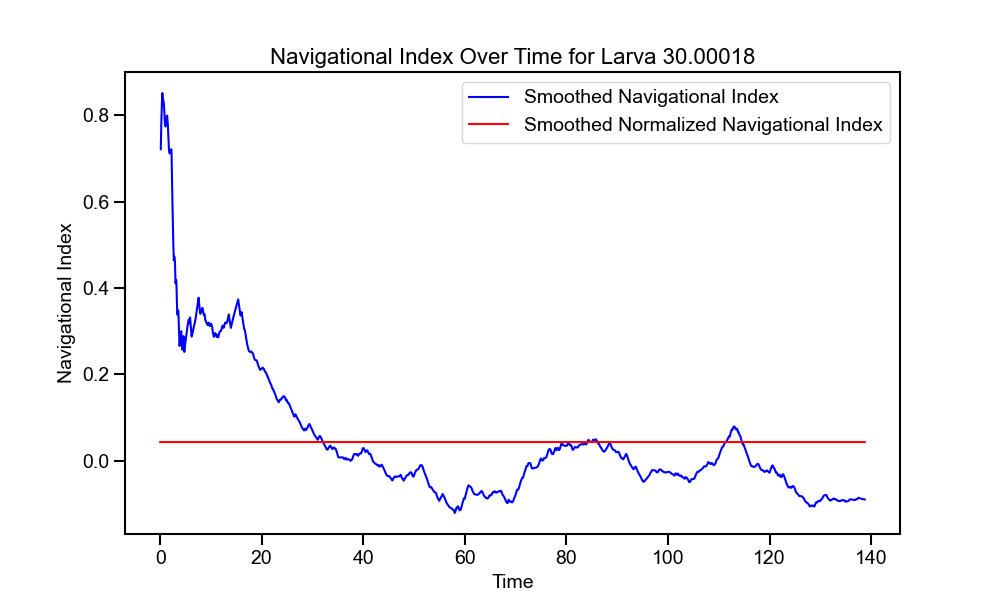

...

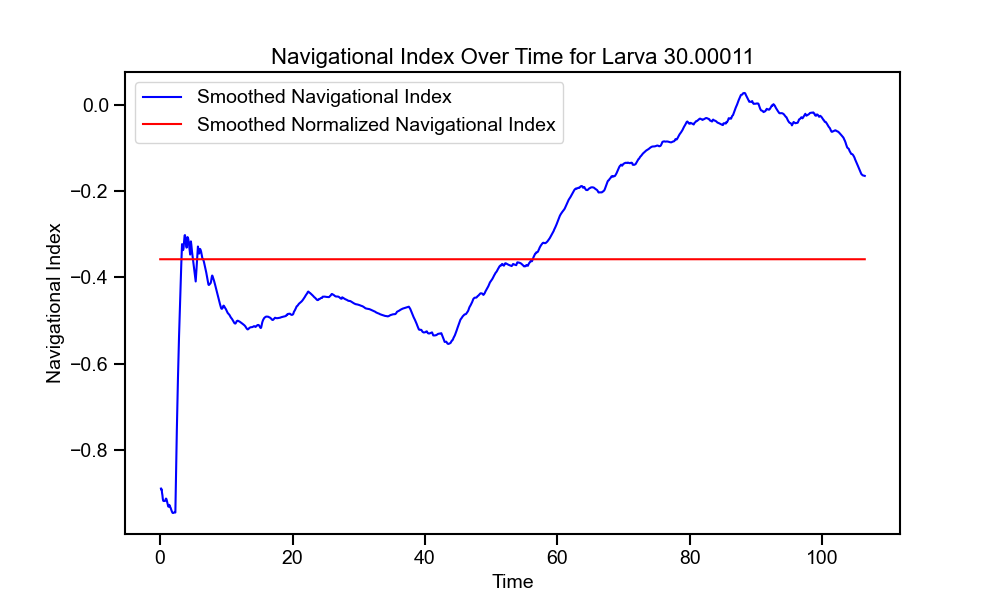

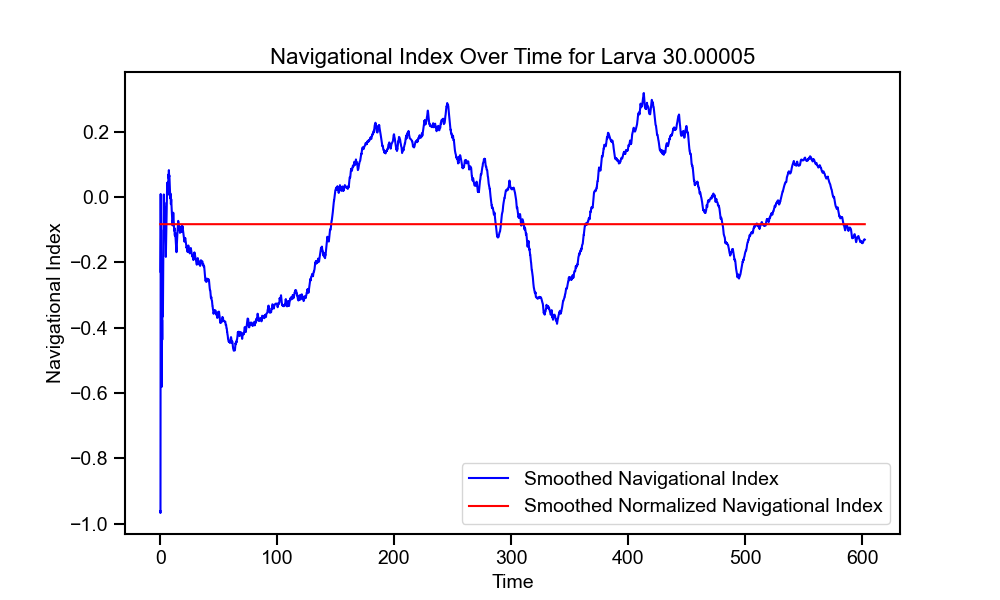

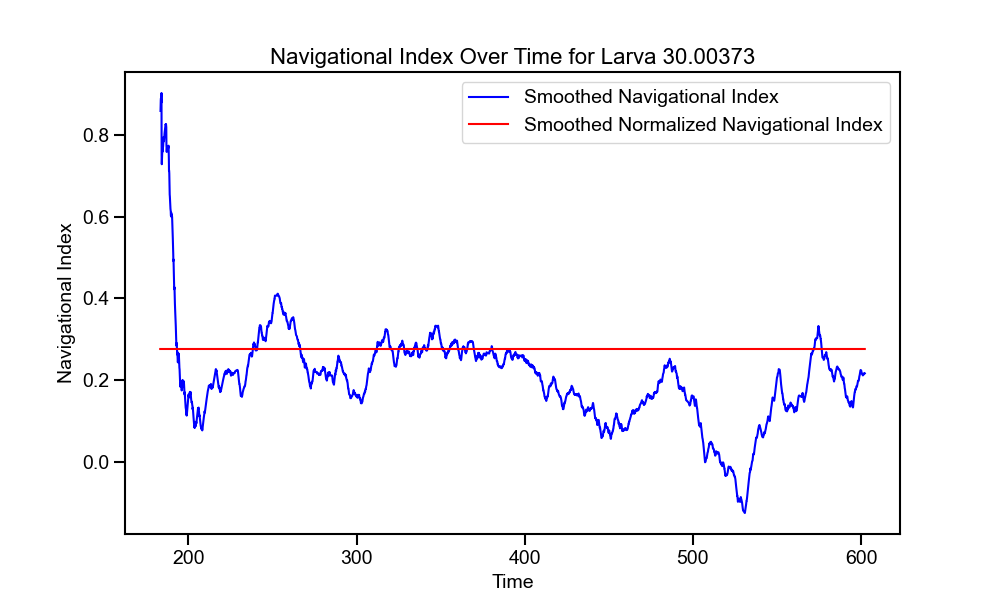

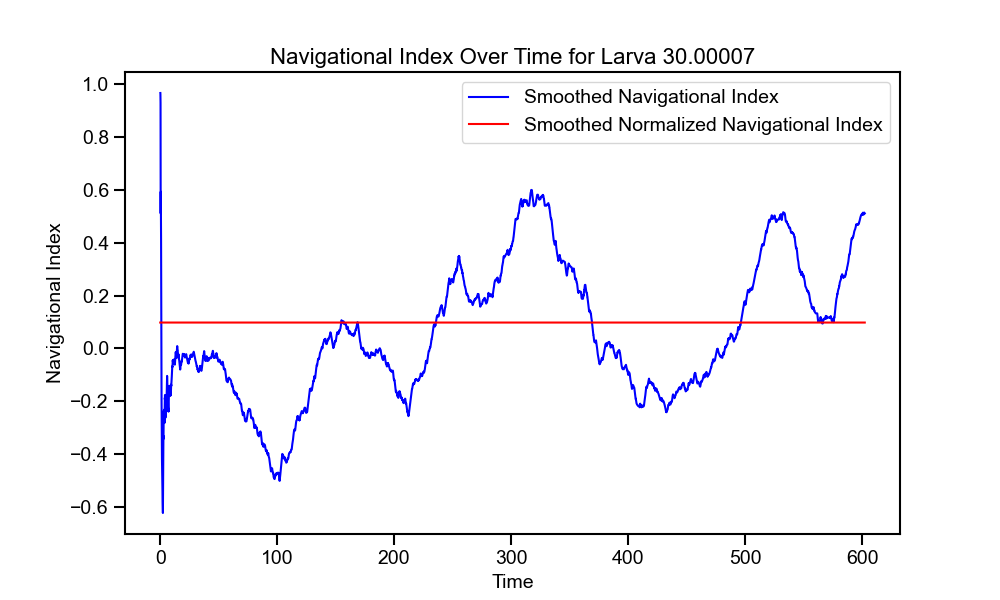

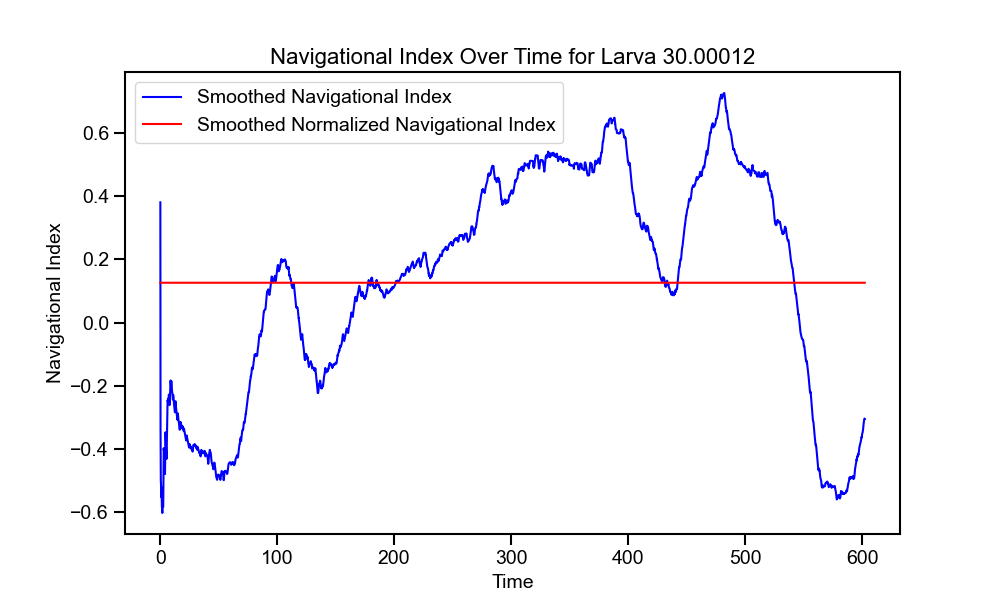

In [22]:
# Plot for all larva IDs in ni_dict with a specified window size
window_size = 500 
for larva_id, ni_df in ni_dict_y.items():
    anm_plot.plot_navigational_index_time_series_single(ni_df, larva_id, window_size)

### Normalised X-axis $N_{ind}$ across individuals

/Users/sharbat/Documents/anemotaxis/src/plot_data.py:260: RuntimeWarning: Mean of empty slice
  mean_ni = np.nanmean(interpolated_ni, axis=0)
/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


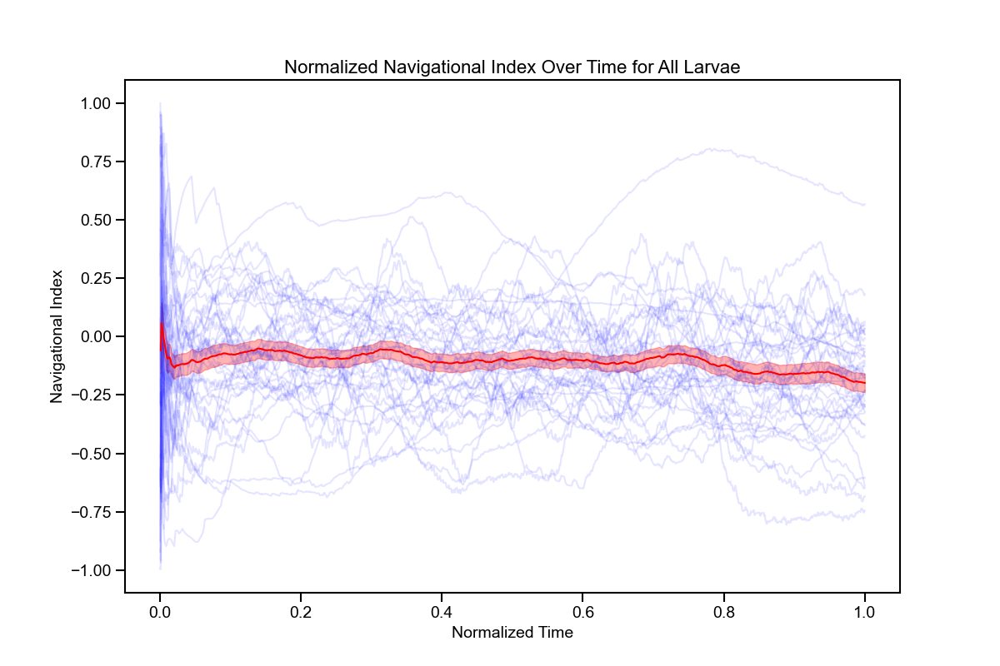

In [23]:
window_size = 500
anm_plot.plot_normalized_navigational_index_time_series(ni_dict_x, window_size=window_size)

/Users/sharbat/Documents/anemotaxis/src/plot_data.py:300: RuntimeWarning: Mean of empty slice
  mean_ni = np.nanmean(interpolated_ni, axis=0)


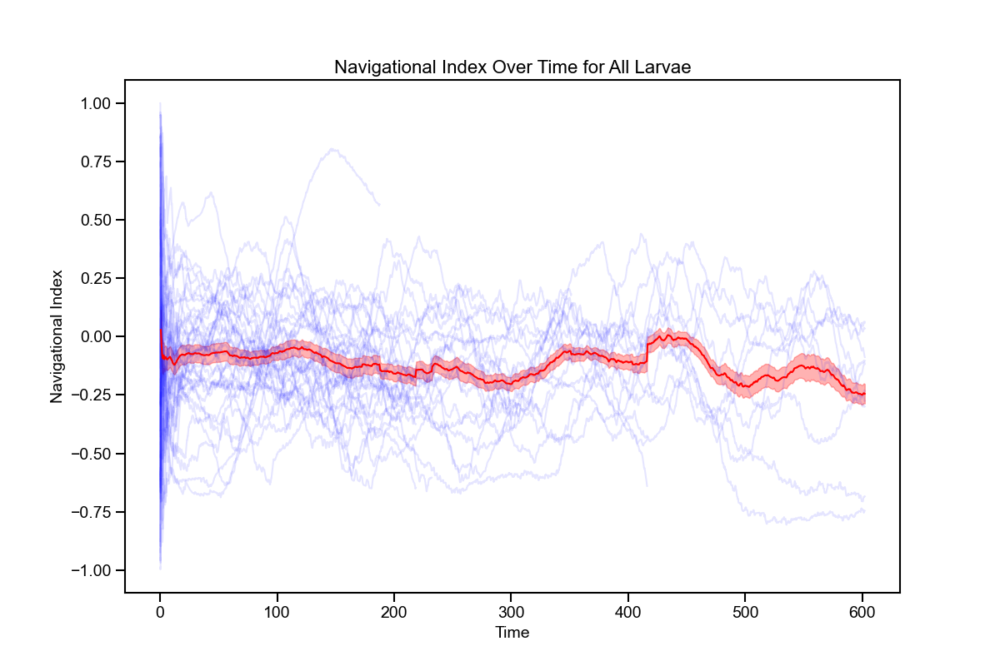

In [24]:
anm_plot.plot_navigational_index_time_series_together(ni_dict_x, window_size=window_size)

### Normalised Y-axis $N_{ind}$ across individuals

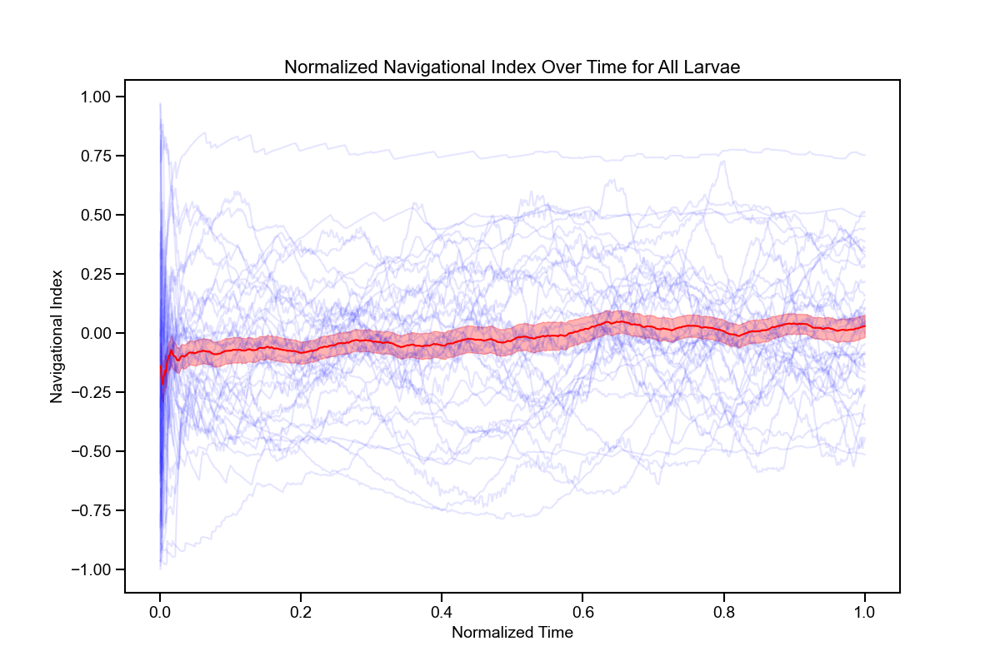

In [25]:
window_size = 500
anm_plot.plot_normalized_navigational_index_time_series(ni_dict_y, window_size=window_size)

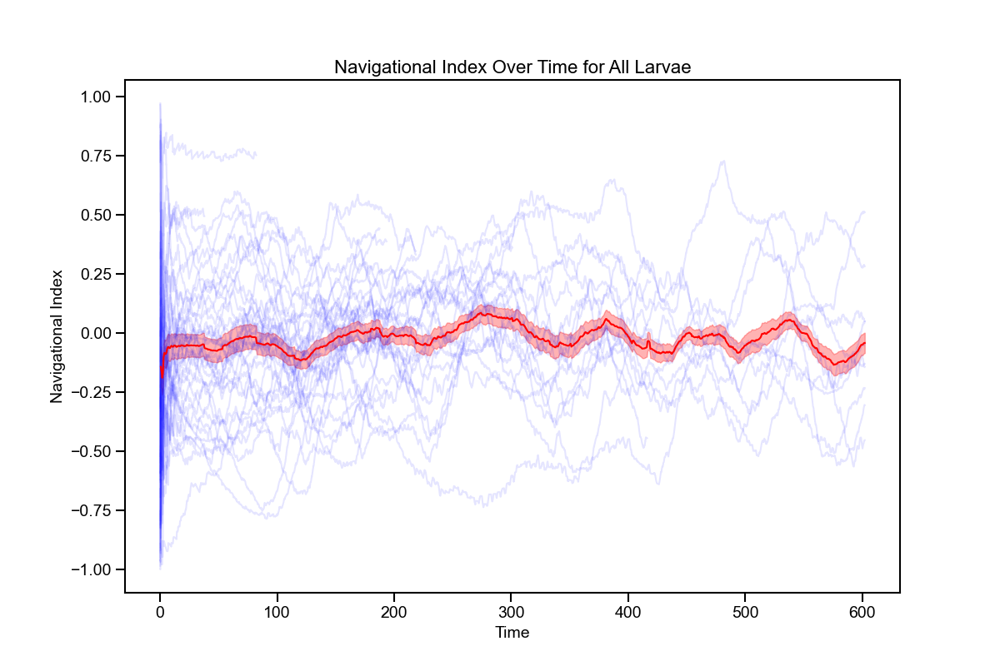

In [26]:
anm_plot.plot_navigational_index_time_series_together(ni_dict_y, window_size=window_size)

### Discussion
- Test how each larvae (or track) moves across time
- Write unit tests

## Exploring `trx.mat` data

In [29]:
trx_path = "/Users/sharbat/Documents/anemotaxis/data/20240219_140808/trx.mat"
# trx_sharbat = anm_parse.import_trx_sharbat(trx_path)
trx_tim = anm_parse.import_trx(trx_path)

59
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{1.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{2.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{3.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{4.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{5.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{6.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{7.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{8.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{9.0}
[[50], [48], [50], [52], [48], [50], [49], [57], [95], [49], [52], [48], [56], [48], [56]]
{11.0}
[[50], [48], [50], [52], [

In [30]:
import h5py
import numpy as np

def import_trx(path):
    """Function that imports a trx file from the path and formats it into a dictionary of dictionaries.
    Also calculates the duration for specific fields like 'run' and 'cast'.
    
    Args:
        path (str): Path to the .trx file.
    
    Returns:
        dict: A dictionary containing data for all larvae.
    """
    field_rmv = [
        'As_smooth_5', 'back', 'back_large', 'back_strong', 'back_weak', 'ball_proba', 'bend_proba', 'cast_large',
        'cast_strong', 'cast_weak', 'curl_proba', 'd_eff_head_norm_deriv_smooth_5', 'd_eff_head_norm_smooth_5',
        'd_eff_tail_norm_deriv_smooth_5', 'd_eff_tail_norm_smooth_5', 'duration_large', 'duration_large_small',
        'eig_deriv_smooth_5', 'eig_smooth_5', 'full_path', 'global_state', 'hunch', 'hunch_large', 'hunch_strong',
        'hunch_weak', 'motion_to_u_tail_head_smooth_5', 'motion_to_v_tail_head_smooth_5', 'motion_velocity_norm_smooth_5',
        'n_duration', 'n_duration_large', 'n_duration_large_small', 'nb_action', 'nb_action_large', 'nb_action_large_small',
        'neuron', 'numero_larva', 'pipeline', 'proba_global_state', 'prod_scal_1', 'prod_scal_2', 'protocol', 'roll',
        'roll_large', 'roll_strong', 'roll_weak', 'run_large', 'run_strong', 'run_weak', 'small_motion', 'start_stop',
        'start_stop_large', 'start_stop_large_small', 'stimuli', 'stop', 'stop_large', 'stop_strong', 'stop_weak',
        'straight_and_light_bend_proba', 'straight_proba', 't_start_stop', 't_start_stop_large', 't_start_stop_large_small',
        'tail_velocity_norm_smooth_5', 'x_contour', 'x_neck', 'x_neck_down', 'x_neck_top', 'x_tail', 'y_contour', 'y_neck',
        'y_neck_down', 'y_neck_top', 'y_tail'
    ]

    with h5py.File(path, 'r') as f:
        fields = list(f['trx'].keys())
        for rmv in field_rmv:
            if rmv in fields:
                fields.remove(rmv)
        
        trx_extracted = {}  # This will be the dictionary containing all larva data

        # Determine the number of larvae
        nb_larvae = f['trx'][fields[0]].shape[1]
        print(f"Number of larvae: {nb_larvae}")

        for i in range(nb_larvae):
            larva = {}
            for field in fields:
                ref = f['trx'][field][0][i]
                data = np.array(f[ref])
                data = data.tolist()
                data = data[0] if len(data) == 1 else data
                larva[field] = data
            
            # Calculate the number of timesteps
            larva["nb_timestep"] = len(larva["t"])
            
            # Calculate durations for 'run' and 'cast'
            for behavior in ['run', 'cast']:
                if behavior in larva:
                    larva[f"{behavior}_duration"] = sum(larva[behavior])  # Sum of 1s in the binary array
                else:
                    larva[f"{behavior}_duration"] = 0
            
            # Extract larva ID and ensure it's hashable
            larva_id = larva.pop("numero_larva_num")
            if isinstance(larva_id, list):
                larva_id = "_".join(map(str, larva_id))  # Convert list to a string
            trx_extracted[larva_id] = larva

    trx = {"data": trx_extracted}
    return trx

# Example usage:
# path = '/mnt/c/Users/schatterjee/Documents/anemotaxis/data/20240219_140808/trx.mat'
# trx_data = import_trx(path)
# print(trx_data)

Number of larvae: 59


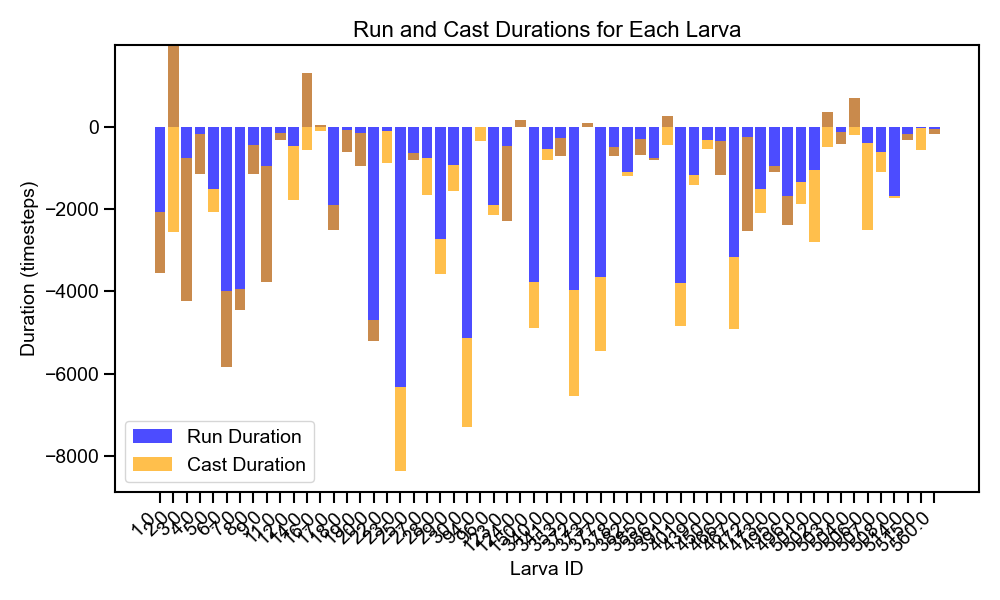

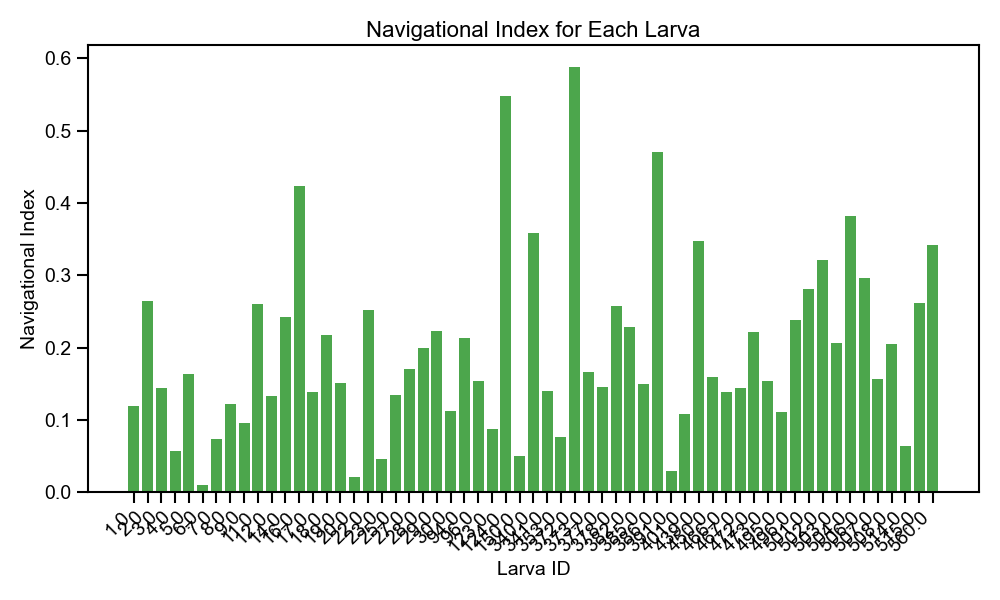

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate navigational index (example metric)
def calculate_navigational_index(larva):
    """Calculates a simple navigational index as an example metric.
    This can be replaced with a more meaningful calculation.
    
    Args:
        larva (dict): Data for a single larva.
    
    Returns:
        float: Navigational index.
    """
    if "x_center" in larva and "y_center" in larva:
        x = np.array(larva["x_center"])
        y = np.array(larva["y_center"])
        displacement = np.sqrt((x[-1] - x[0])**2 + (y[-1] - y[0])**2)
        path_length = np.sum(np.sqrt(np.diff(x)**2 + np.diff(y)**2))
        return displacement / path_length if path_length > 0 else 0
    return 0

# Generate graphs for run and cast categories
def plot_run_cast_metrics(trx_data):
    """Plots metrics for run and cast categories.
    
    Args:
        trx_data (dict): Data for all larvae.
    """
    run_durations = []
    cast_durations = []
    navigational_indices = []
    larva_ids = []

    # Extract data for each larva
    for larva_id, larva in trx_data["data"].items():
        run_durations.append(larva["run_duration"])
        cast_durations.append(larva["cast_duration"])
        navigational_indices.append(calculate_navigational_index(larva))
        larva_ids.append(larva_id)

    # Plot run and cast durations
    plt.figure(figsize=(10, 6))
    plt.bar(larva_ids, run_durations, label="Run Duration", alpha=0.7, color="blue")
    plt.bar(larva_ids, cast_durations, label="Cast Duration", alpha=0.7, color="orange", bottom=run_durations)
    plt.xlabel("Larva ID")
    plt.ylabel("Duration (timesteps)")
    plt.title("Run and Cast Durations for Each Larva")
    plt.xticks(rotation=45, ha="right")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot navigational index
    plt.figure(figsize=(10, 6))
    plt.bar(larva_ids, navigational_indices, color="green", alpha=0.7)
    plt.xlabel("Larva ID")
    plt.ylabel("Navigational Index")
    plt.title("Navigational Index for Each Larva")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

# Example usage
path = "/Users/sharbat/Documents/anemotaxis/data/20240219_140808/trx.mat"
trx_data = import_trx(path)

# Generate graphs
plot_run_cast_metrics(trx_data)

In [35]:
import numpy as np

def calculate_navigational_index(larva, behavior):
    """Calculates the navigational index for a specific behavior (run or cast).
    
    Args:
        larva (dict): Data for a single larva.
        behavior (str): The behavior to calculate the index for ('run' or 'cast').
    
    Returns:
        float: Navigational index for the specified behavior.
    """
    if behavior not in larva or "x_center" not in larva or "y_center" not in larva:
        return 0  # Return 0 if the required data is missing

    # Extract relevant data
    x = np.array(larva["x_center"])
    y = np.array(larva["y_center"])
    behavior_mask = np.array(larva[behavior], dtype=bool)

    # Filter the trajectory data based on the behavior mask
    x_behavior = x[behavior_mask]
    y_behavior = y[behavior_mask]

    if len(x_behavior) < 2:  # Not enough points to calculate displacement or path length
        return 0

    # Calculate displacement (straight-line distance)
    displacement = np.sqrt((x_behavior[-1] - x_behavior[0])**2 + (y_behavior[-1] - y_behavior[0])**2)

    # Calculate path length (sum of distances between consecutive points)
    path_length = np.sum(np.sqrt(np.diff(x_behavior)**2 + np.diff(y_behavior)**2))

    # Return the navigational index
    return displacement / path_length if path_length > 0 else 0

# Example usage
path = "/Users/sharbat/Documents/anemotaxis/data/20240219_140808/trx.mat"
trx_data = import_trx(path)

# Calculate navigational indices for run and cast for each larva
for larva_id, larva in trx_data["data"].items():
    run_navigational_index = calculate_navigational_index(larva, "run")
    cast_navigational_index = calculate_navigational_index(larva, "cast")
    print(f"Larva ID: {larva_id}")
    print(f"Run Navigational Index: {run_navigational_index}")
    print(f"Cast Navigational Index: {cast_navigational_index}")

Number of larvae: 59
Larva ID: 1.0
Run Navigational Index: 0.1195251402902069
Cast Navigational Index: 0.1195251402902069
Larva ID: 2.0
Run Navigational Index: 0.2641064491477039
Cast Navigational Index: 0.2641064491477039
Larva ID: 3.0
Run Navigational Index: 0.1445639898512003
Cast Navigational Index: 0.1445639898512003
Larva ID: 4.0
Run Navigational Index: 0.05691514400080546
Cast Navigational Index: 0.05691514400080546
Larva ID: 5.0
Run Navigational Index: 0.1635988874717951
Cast Navigational Index: 0.1635988874717951
Larva ID: 6.0
Run Navigational Index: 0.009247446500615323
Cast Navigational Index: 0.009247446500615323
Larva ID: 7.0
Run Navigational Index: 0.07345393821990993
Cast Navigational Index: 0.07345393821990993
Larva ID: 8.0
Run Navigational Index: 0.1220297065232599
Cast Navigational Index: 0.1220297065232599
Larva ID: 9.0
Run Navigational Index: 0.09583381727099541
Cast Navigational Index: 0.09583381727099541
Larva ID: 11.0
Run Navigational Index: 0.2607676336824337
Ca